In [34]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from gtda.pipeline import Pipeline
from gtda.time_series import Resampler
from gtda.diagrams import PersistenceEntropy, Scaler, HeatKernel, BettiCurve
import numpy as np
from gtda.time_series import SingleTakensEmbedding, takens_embedding_optimal_parameters, TakensEmbedding
from sklearn.decomposition import PCA
from gtda.plotting import plot_point_cloud
from gtda.homology import VietorisRipsPersistence
from gtda.metaestimators import CollectionTransformer

We start by analyzing the public data set and looking at the normal operations time series, to set a benchmark for the analysis of well events (abnormal operations). 

In [35]:
def find_shortest_file(path, label):
    tmp = []
    os.chdir(path)
    for file in os.listdir():
        data_df = pd.read_csv(file)
        tmp.append(len(data_df[label]))
    return min(tmp)

In [36]:
def read_files(path, label, limit):
    data = []
    os.chdir(path)
    for file in os.listdir():
        data_df = pd.read_csv(file)
        # fill NaN with an interpolated value
        data_df = data_df.interpolate()
        period = int(len(data_df)/limit)
        periodicSampler = Resampler(period=period)
        # print(file, len(data_df), limit, 'resampled to period:', period)
        # resample the files to that all of them are the same length (in entries)
        # NOTE: timestamps are omitted and timesteps are going to be different for each resampled time series!
        index_sampled, signal_sampled = periodicSampler.fit_transform_resample(data_df.index, data_df[label])
        data.append(signal_sampled)
    data_T = list(map(list, zip(*data)))
    df = pd.DataFrame.from_records(data_T)
    return data, df

In [37]:
find_shortest_file("/Users/simo/repos/RareEventsDataset/3w_dataset-master/data/data/0", "P-TPT")

7010

In [38]:
normal_signals, normal_df = read_files("/Users/simo/repos/RareEventsDataset/3w_dataset-master/data/data/0/", "P-TPT",7000)

In [39]:
normal_df

,0,1,2,3,4,5,6,7,8,9,...,587,588,589,590,591,592,593,594,595,596
0,8698015.0,13987430.0,8648771.0,13036680.0,8055306.0,14184150.0,14221150.0,20932460.0,13385940.0,21146550.0,...,8706865.0,8550073.0,13849550.0,20997960.0,20811280.0,10005130.0,20934760.0,8179326.0,8499783.0,8101855.0
1,8698015.0,13987410.0,8648666.0,13036670.0,8054974.0,14184150.0,14221370.0,20931700.0,13386030.0,21146550.0,...,8706792.0,8550283.0,13849630.0,20998250.0,20810870.0,10005340.0,20931310.0,8179326.0,8499915.0,8101190.0
2,8698015.0,13987390.0,8648560.0,13036660.0,8054641.0,14184150.0,14221590.0,20930930.0,13386130.0,21146550.0,...,8706720.0,8550493.0,13849720.0,20998540.0,20810660.0,10005550.0,20927870.0,8179326.0,8500049.0,8100525.0
3,8698015.0,13987370.0,8648456.0,13036650.0,8054308.0,14184150.0,14221820.0,20930170.0,13386220.0,21146550.0,...,8706647.0,8550703.0,13849800.0,20998830.0,20810660.0,10005760.0,20930170.0,8179326.0,8500182.0,8099860.0
4,8698015.0,13987350.0,8648351.0,13036650.0,8053976.0,14184150.0,14222040.0,20929400.0,13386310.0,21146550.0,...,8706575.0,8550913.0,13849890.0,20999110.0,20810660.0,10005970.0,20932460.0,8179326.0,8500314.0,8099195.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7005,8420715.0,13986730.0,8578317.0,12998830.0,8717964.0,14224980.0,14184150.0,20911490.0,13385700.0,21146550.0,...,8478569.0,8578317.0,13846380.0,20995550.0,20812950.0,10014690.0,20883690.0,7929529.0,8498519.0,8887589.0
7006,8420383.0,13986600.0,8578317.0,12999160.0,8717964.0,14224840.0,14184150.0,20911210.0,13385520.0,21146550.0,...,8478569.0,8578317.0,13846280.0,20995440.0,20812950.0,10014690.0,20883430.0,7929433.0,8498519.0,8887482.0
7007,8420050.0,13986480.0,8578317.0,12999490.0,8717964.0,14224710.0,14184150.0,20910920.0,13385330.0,21146550.0,...,8478569.0,8578317.0,13846180.0,20995320.0,20812950.0,10014690.0,20883180.0,7929339.0,8498519.0,8887373.0
7008,8419717.0,13986350.0,8578317.0,12999830.0,8717964.0,14224580.0,14184150.0,20910630.0,13385140.0,21146550.0,...,8478569.0,8578317.0,13846070.0,20995210.0,20812950.0,10014690.0,20882920.0,7929243.0,8498519.0,8887266.0


In [40]:
signal = normal_df[6]
max_time_delay = 200
max_embedding_dimension = 30
stride = 3

optimal_time_delay, optimal_embedding_dimension = takens_embedding_optimal_parameters(
    signal, max_time_delay, max_embedding_dimension, stride=stride
    )

print(f"Optimal embedding time delay based on mutual information: {optimal_time_delay}")
print(f"Optimal embedding dimension based on false nearest neighbors: {optimal_embedding_dimension}")

embedding_dimension = optimal_embedding_dimension
embedding_time_delay = optimal_time_delay


embedder = SingleTakensEmbedding(
    parameters_type="fixed", n_jobs=-1, time_delay=embedding_time_delay, dimension=embedding_dimension, stride=stride
)

signal_embedded = embedder.fit_transform(signal)

pca = PCA(n_components=3)
signal_embedded_pca = pca.fit_transform(signal_embedded)

plot_point_cloud(signal_embedded_pca)

Optimal embedding time delay based on mutual information: 200
Optimal embedding dimension based on false nearest neighbors: 10


Let's start by using one single value of embedding parameters for all the regular operation conditions time series. And see if there is any high-dimensional homology generator (dim=2).

In [74]:
def batch_analyzer(input_df, stride, max_embedding_dimension, max_time_delay):
    max_time_delay = int(max_time_delay)
    max_embedding_dimension = int(max_embedding_dimension)
    homology_dimensions = (0, 1)
    VRP = VietorisRipsPersistence(homology_dimensions=homology_dimensions)
    pca = PCA(n_components=3)
    PE_signal = PersistenceEntropy()
    PE_norm = PersistenceEntropy(normalize=True)

    entropies = []
    norm_entropies = []
    diagrams = []
    point_clouds_pca = []
    i = 0

    for timeserie in input_df:
        i += 1
        optimal_time_delay, optimal_embedding_dimension = takens_embedding_optimal_parameters(
            input_df[timeserie], max_time_delay, max_embedding_dimension, stride=stride
            )
        if optimal_embedding_dimension < 3:
            optimal_embedding_dimension = 3
            
        print('analyzing nr.',i, 'progress:',int(100*i/len(input_df.columns)),'%', 'dim',optimal_embedding_dimension,'delay', optimal_time_delay)

        
        embedder = SingleTakensEmbedding(
            parameters_type="fixed", n_jobs=6, time_delay=optimal_time_delay, dimension=optimal_embedding_dimension, stride=stride
            )

        y_signal_embedded = embedder.fit_transform(input_df[timeserie])
        y_signal_embedded_reshaped = y_signal_embedded.reshape(1, *y_signal_embedded.shape)
        y_signal_embedded_pca = pca.fit_transform(y_signal_embedded)

        X_diagram = VRP.fit_transform(y_signal_embedded_reshaped)
        features = PE_signal.fit_transform(X_diagram)
        features_norm = PE_norm.fit_transform(X_diagram)

        point_clouds_pca.append(y_signal_embedded_pca)
        entropies.append(features)
        norm_entropies.append(features_norm)
        diagrams.append(X_diagram)
    return(point_clouds_pca, diagrams, entropies, norm_entropies)

In [183]:
normal_point_clouds_pca, normal_diagrams, normal_entropies, normal_norm_entropies = batch_analyzer(normal_df, 5)

/Users/simo/Documents/Projects/TDA/.venv/lib/python3.8/site-packages/sklearn/decomposition/_pca.py:470: RuntimeWarning:

invalid value encountered in true_divide

/Users/simo/Documents/Projects/TDA/.venv/lib/python3.8/site-packages/sklearn/decomposition/_pca.py:470: RuntimeWarning:

invalid value encountered in true_divide

/Users/simo/Documents/Projects/TDA/.venv/lib/python3.8/site-packages/sklearn/decomposition/_pca.py:470: RuntimeWarning:

invalid value encountered in true_divide

/Users/simo/Documents/Projects/TDA/.venv/lib/python3.8/site-packages/sklearn/decomposition/_pca.py:470: RuntimeWarning:

invalid value encountered in true_divide

/Users/simo/Documents/Projects/TDA/.venv/lib/python3.8/site-packages/sklearn/decomposition/_pca.py:470: RuntimeWarning:

invalid value encountered in true_divide

/Users/simo/Documents/Projects/TDA/.venv/lib/python3.8/site-packages/sklearn/decomposition/_pca.py:470: RuntimeWarning:

invalid value encountered in true_divide

/Users/simo/Documents/

In [214]:
tmp = normal_entropies
Entropy_H0 = []
Entropy_H1 = []

for item in tmp:
    Entropy_H0.append(item[0][0])
    Entropy_H1.append(item[0][1])

Entropy_H1_series = pd.Series(Entropy_H1)

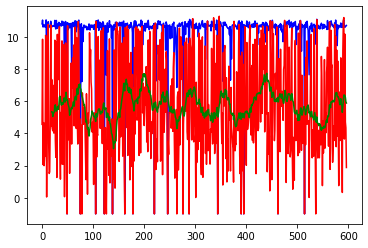

In [297]:
plt.plot(Entropy_H0, 'b-')
plt.plot(Entropy_H1, 'r-')
plt.plot(Entropy_H1_series.rolling(20).mean(), 'g-')

So, entropies (non-normalized) are clustered around 10 for H0 generators, and 6 for H1 generators with the latter having a much larger variance. 

Looking more carefully at the timeseries, we can see that those that give the most problems are those who are monotonically increasing or decreasing. 

In [316]:
i = 0
for timeserie in normal_df:
    i += 1
   # print(normal_df[timeserie].iloc[-1])
    if abs(normal_df[timeserie].iloc[-1]-normal_df[timeserie].iloc[0]) > 1000000:
        print(i-1, normal_df[timeserie].iloc[-1], normal_df[timeserie].iloc[0])

41 8737914.0 7644843.0
441 9099334.0 7947331.0
446 9087492.0 7461141.0


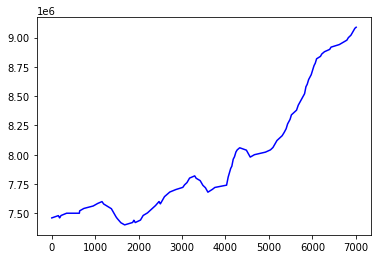

In [324]:
plt.plot(normal_df[446], 'b-')

In [325]:
plot_point_cloud(point_clouds_pca[446])

In [326]:
persistence.plot(diagrams[446])

In [327]:
print('Entropy for timeseries #446:', Entropy_H0[446], Entropy_H1[446])

Entropy for timeseries #446: 10.833537967462052 0.4293937379385461


These have some high persistency H1 points, probably due to some dynamics that is not evident at this scale. Other low-entropy time series have some sort of dynamic, and we argue that they may not be entirely classified correctly as normal operations.

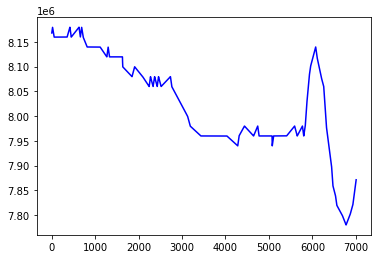

In [310]:
plt.plot(normal_df[114], 'b-')

In [311]:
persistence.plot(diagrams[114])

In [313]:
plot_point_cloud(point_clouds_pca[114])

In [312]:
print('Entropy for timeseries #114:', Entropy_H0[114], Entropy_H1[114])

Entropy for timeseries #114: 10.607986134400125 4.313914212609864


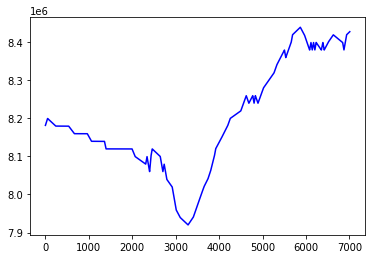

In [252]:
plt.plot(normal_df[491], 'b-')

In [255]:
plot_point_cloud(point_clouds_pca[491])

In [253]:
persistence.plot(diagrams[491])

In [254]:
print('Entropy for timeseries #25:', Entropy_H0[491], Entropy_H1[491])

Entropy for timeseries #25: 10.667595549181998 0.5357958588152831


Other stationary time series show instead no high persistence points and more high entropy (around 10) for both H0 and H1 generators. 

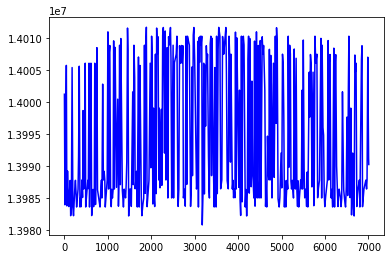

In [235]:
plt.plot(normal_df[25], 'b-')

In [328]:
plot_point_cloud(point_clouds_pca[25])

In [236]:
persistence.plot(diagrams[25])

In [246]:
print('Entropy for timeseries #25:', Entropy_H0[25], Entropy_H1[25])

Entropy for timeseries #25: 11.027348108746713 9.796382374260716


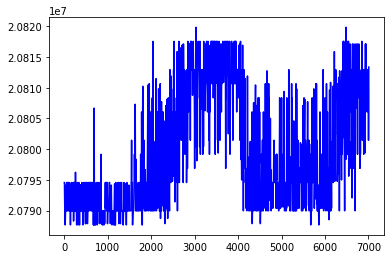

In [338]:
plt.plot(normal_df[189], 'b-')

In [339]:
print('Entropy for timeseries #25:', Entropy_H0[189], Entropy_H1[189])

Entropy for timeseries #25: 10.736229180426315 10.408366128202946


Note that jumps in the mean of the time serie do not affect the persistence diagram nor the entropy of the embedded time series.

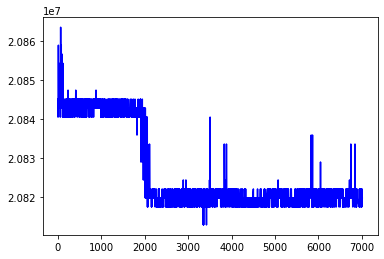

In [293]:
plt.plot(normal_df[188], 'b-')

In [314]:
plot_point_cloud(point_clouds_pca[188])

In [31]:
persistence.plot(diagrams[188])

NameError: name 'persistence' is not defined

In [294]:
print('Entropy for timeseries #25:', Entropy_H0[188], Entropy_H1[188])

Entropy for timeseries #25: 10.71644112399484 10.489766532456173


In [30]:
Betti = BettiCurve()
Betti.fit_transform_plot(diagrams[188])

NameError: name 'diagrams' is not defined

The reason for a low average of H1-entropies is in the sharp oscillations seen in most of the time series.  

In [336]:
Entropy_H1[20]

4.305088196644526

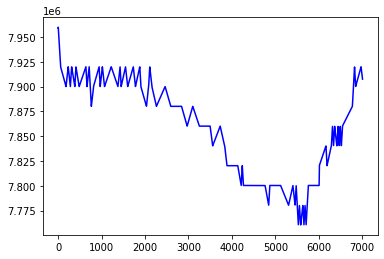

In [347]:
plt.plot(normal_df[20], 'b-')

In [342]:
plot_point_cloud(point_clouds_pca[20])

In [341]:
persistence.plot(diagrams[20])

In [561]:
steps = [#("resampler", resampler),
         ("embedder", embedder),
         ("pca", batch_pca),
         #("persistence", persistence),
         #("scaling", scaling),
         #("entropy", entropy)
        ]
topological_transfomer = Pipeline(steps)

In [526]:
features_new = topological_transfomer.fit_transform(features.T)
features_new.shape

(2, 950, 3)

In [539]:
plot_point_cloud(features_new[0])

Just checking by comparing with a single embedding 

In [622]:
slug_data_single_df = pd.read_csv("/Users/simo/repos/RareEventsDataset/3w_dataset-master/data/data/0/test/WELL-00001_20170320130025.csv")
signal = slug_data_single_df["P-TPT"]

In [623]:
optimal_time_delay, optimal_embedding_dimension = takens_embedding_optimal_parameters(
    signal, max_time_delay, max_embedding_dimension, stride=stride
    )

print(f"Optimal embedding time delay based on mutual information: {optimal_time_delay}")
print(f"Optimal embedding dimension based on false nearest neighbors: {optimal_embedding_dimension}")

embedding_dimension = optimal_embedding_dimension
embedding_time_delay = optimal_time_delay
stride = 1

embedder = SingleTakensEmbedding(
    parameters_type="fixed", n_jobs=optimal_embedding_dimension, time_delay=optimal_time_delay, dimension=6, stride=stride
)

signal_embedded = embedder.fit_transform(signal)

pca = PCA(n_components=3)
signal_embedded_pca = pca.fit_transform(signal_embedded)

plot_point_cloud(signal_embedded_pca)

Optimal embedding time delay based on mutual information: 289
Optimal embedding dimension based on false nearest neighbors: 9


In [541]:
signal_embedded_pca.shape

(1748, 3)

Here I mention a pathological time series that, even though it represents normal operations, it shows a periodic pattern, i.e. high persistency.

In [3]:
normal_data_df_231 = pd.read_csv("/Users/simo/repos/RareEventsDataset/3w_dataset-master/data/data/0/WELL-00004_20140807000129.csv")

In [4]:
target = normal_data_df_231["P-TPT"][0]
for entry in normal_df:
    if normal_df[entry][0] == target:
        print(entry)

NameError: name 'normal_df' is not defined

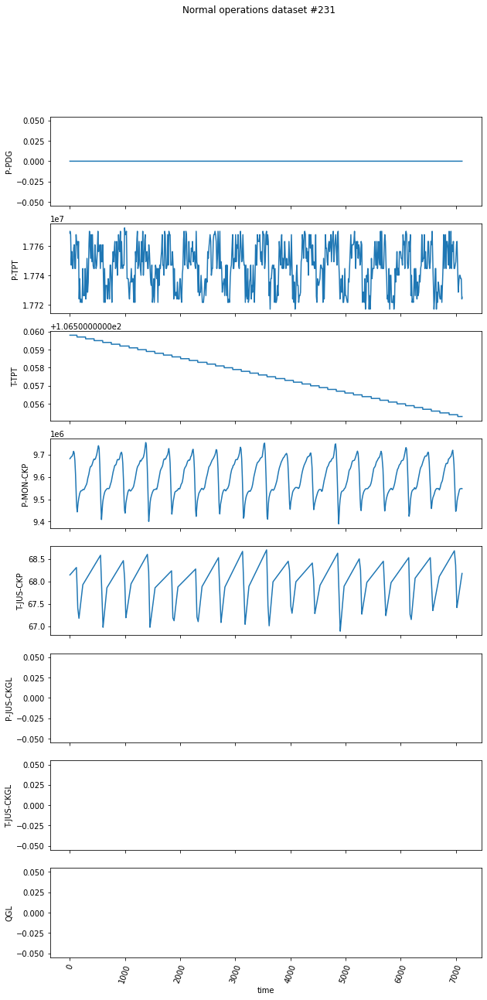

In [5]:
fig, ts = plt.subplots(8,figsize=(10,20),sharex = True)

fig.suptitle('Normal operations dataset #231')
ts[7].set_xlabel('time')
ts[0].set_ylabel("P-PDG")
ts[1].set_ylabel('P-TPT')
ts[2].set_ylabel('T-TPT')
ts[3].set_ylabel("P-MON-CKP")
ts[4].set_ylabel('T-JUS-CKP')
ts[5].set_ylabel('P-JUS-CKGL')
ts[6].set_ylabel("T-JUS-CKGL")
ts[7].set_ylabel('QGL')

degrees = 70
plt.xticks(rotation=degrees)

ts[0].plot(normal_data_df_231.index, normal_data_df_231["P-PDG"])
ts[1].plot(normal_data_df_231.index, normal_data_df_231["P-TPT"])
ts[2].plot(normal_data_df_231.index, normal_data_df_231["T-TPT"])
ts[3].plot(normal_data_df_231.index, normal_data_df_231["P-MON-CKP"])
ts[4].plot(normal_data_df_231.index, normal_data_df_231["T-JUS-CKP"])
ts[5].plot(normal_data_df_231.index, normal_data_df_231["P-JUS-CKGL"])
ts[6].plot(normal_data_df_231.index, normal_data_df_231["T-JUS-CKGL"])
ts[7].plot(normal_data_df_231.index, normal_data_df_231["QGL"])

In [6]:
plt.plot(normal_df[231], 'b-')

NameError: name 'normal_df' is not defined

In [15]:
signal = normal_data_df_231['P-TPT']
max_time_delay = 200
max_embedding_dimension = 30
stride = 1

optimal_time_delay, optimal_embedding_dimension = takens_embedding_optimal_parameters(
    signal, max_time_delay, max_embedding_dimension, stride=stride
    )

print(f"Optimal embedding time delay based on mutual information: {optimal_time_delay}")
print(f"Optimal embedding dimension based on false nearest neighbors: {optimal_embedding_dimension}")

embedding_dimension = optimal_embedding_dimension
embedding_time_delay = optimal_time_delay


embedder = SingleTakensEmbedding(
    parameters_type="fixed", n_jobs=-1, time_delay=embedding_time_delay, dimension=embedding_dimension, stride=stride
)

signal_embedded = embedder.fit_transform(signal)

pca = PCA(n_components=3)
signal_embedded_pca = pca.fit_transform(signal_embedded)

plot_point_cloud(signal_embedded_pca)

Optimal embedding time delay based on mutual information: 109
Optimal embedding dimension based on false nearest neighbors: 24


Now, looking at the slugging, i.e. dataset nr.3

In [84]:
find_shortest_file("/Users/simo/repos/RareEventsDataset/3w_dataset-master/data/data/3/REAL/", "P-TPT")

14385

In [105]:
slugging_signals, slugging_df = read_files("/Users/simo/repos/RareEventsDataset/3w_dataset-master/data/data/3/REAL/", "P-TPT",14000)

In [115]:
slugging_df_resampled = slugging_df[::10]

In [116]:
slugging_df_resampled

,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
0,15923800.0,16364360.0,14545720.0,15763660.0,14563290.0,16229530.0,15593270.0,14071870.0,15840130.0,14177770.0,...,13829370.0,15829460.0,16268030.0,14860340.0,14000140.0,15411580.0,14999240.0,15915160.0,14880540.0,13445530.0
10,15912720.0,16362380.0,14551830.0,15765690.0,14590570.0,16229360.0,15599700.0,14074970.0,15817510.0,14185840.0,...,13841950.0,15835000.0,16263820.0,14871360.0,14008580.0,15420080.0,15006930.0,15917620.0,14894200.0,13444910.0
20,15897370.0,16363950.0,14559050.0,15772310.0,14607750.0,16230600.0,15606990.0,14078060.0,15790800.0,14194490.0,...,13854790.0,15840540.0,16260860.0,14880480.0,14015900.0,15426060.0,15013240.0,15924210.0,14907540.0,13445100.0
30,15879760.0,16368300.0,14566830.0,15781490.0,14629470.0,16231210.0,15614680.0,14081150.0,15760420.0,14202520.0,...,13867990.0,15848330.0,16257870.0,14894380.0,14025430.0,15434260.0,15018940.0,15928050.0,14920190.0,13446280.0
40,15861750.0,16375980.0,14575700.0,15784650.0,14643980.0,16228860.0,15618130.0,14084250.0,15735790.0,14212070.0,...,13884100.0,15854530.0,16256660.0,14905270.0,14036590.0,15443650.0,15026820.0,15931730.0,14932350.0,13446260.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14340,16265760.0,13607280.0,14059430.0,15558700.0,14354830.0,16163460.0,15391360.0,14401270.0,15365030.0,13588620.0,...,15665990.0,15638120.0,16402500.0,16224380.0,13439200.0,14667760.0,16484210.0,14190940.0,13338100.0,13821130.0
14350,16266120.0,13592460.0,14051460.0,15569210.0,14364940.0,16161560.0,15406550.0,14402930.0,15363480.0,13611950.0,...,15672850.0,15647460.0,16402670.0,16224770.0,13444420.0,14676040.0,16495450.0,14197930.0,13314140.0,13826690.0
14360,16264380.0,13580850.0,14047220.0,15572580.0,14374490.0,16158970.0,15420500.0,14403100.0,15359660.0,13634530.0,...,15678320.0,15657100.0,16401020.0,16231120.0,13449290.0,14682440.0,16510220.0,14203830.0,13293230.0,13831050.0
14370,16263990.0,13570900.0,14040280.0,15578120.0,14380860.0,16158050.0,15431360.0,14402280.0,15359120.0,13661450.0,...,15685390.0,15669040.0,16397440.0,16238270.0,13455250.0,14690510.0,16514860.0,14210310.0,13264290.0,13835890.0


In [117]:
len(slugging_df_resampled)

1439

In [135]:
slug_point_clouds_pca, slug_diagrams, slug_entropies, slug_norm_entropies = batch_analyzer(slugging_df_resampled, 1, 15, 80)

analyzing nr. 1 progress: 3 % dim 10 delay 80
analyzing nr. 2 progress: 6 % dim 12 delay 66
analyzing nr. 3 progress: 9 % dim 12 delay 65
analyzing nr. 4 progress: 12 % dim 10 delay 78
analyzing nr. 5 progress: 15 % dim 11 delay 73
analyzing nr. 6 progress: 18 % dim 10 delay 80
analyzing nr. 7 progress: 21 % dim 10 delay 78
analyzing nr. 8 progress: 25 % dim 10 delay 76
analyzing nr. 9 progress: 28 % dim 10 delay 77
analyzing nr. 10 progress: 31 % dim 10 delay 78
analyzing nr. 11 progress: 34 % dim 10 delay 80
analyzing nr. 12 progress: 37 % dim 9 delay 78
analyzing nr. 13 progress: 40 % dim 10 delay 79
analyzing nr. 14 progress: 43 % dim 12 delay 63
analyzing nr. 15 progress: 46 % dim 10 delay 79
analyzing nr. 16 progress: 50 % dim 10 delay 76
analyzing nr. 17 progress: 53 % dim 10 delay 80
analyzing nr. 18 progress: 56 % dim 10 delay 76
analyzing nr. 19 progress: 59 % dim 10 delay 79
analyzing nr. 20 progress: 62 % dim 10 delay 78
analyzing nr. 21 progress: 65 % dim 12 delay 67
analy

In [136]:
tmp = slug_entropies
Entropy_H0 = []
Entropy_H1 = []

for item in tmp:
    Entropy_H0.append(item[0][0])
    Entropy_H1.append(item[0][1])

Entropy_H0_slug = pd.Series(Entropy_H0)
Entropy_H1_slug = pd.Series(Entropy_H1)

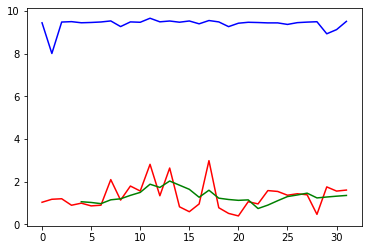

In [137]:
plt.plot(Entropy_H0_slug, 'b-')
plt.plot(Entropy_H1_slug, 'r-')
plt.plot(Entropy_H1_slug.rolling(5).mean(), 'g-')

In [138]:
tmp = slug_norm_entropies
Entropy_H0 = []
Entropy_H1 = []

for item in tmp:
    Entropy_H0.append(item[0][0])
    Entropy_H1.append(item[0][1])

Entropy_H0_slug = pd.Series(Entropy_H0)
Entropy_H1_slug = pd.Series(Entropy_H1)

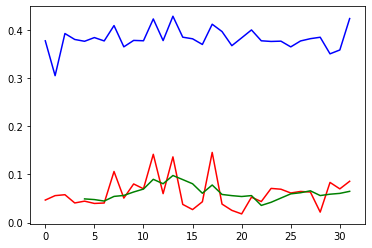

In [139]:
plt.plot(Entropy_H0_slug, 'b-')
plt.plot(Entropy_H1_slug, 'r-')
plt.plot(Entropy_H1_slug.rolling(5).mean(), 'g-')

In [140]:
find_shortest_file("/Users/simo/repos/RareEventsDataset/3w_dataset-master/data/data/3/SIMULATED/", "P-TPT")

12999

In [141]:
slugging_signals, slugging_SIM_df = read_files("/Users/simo/repos/RareEventsDataset/3w_dataset-master/data/data/3/SIMULATED/", "P-TPT",12500)

In [142]:
slugging_SIM_df_resampled = slugging_SIM_df[::12]

In [143]:
slugging_SIM_df_resampled

,0,1,2,3,4,5,6,7,8,9,...,64,65,66,67,68,69,70,71,72,73
0,9617383.0,10829880.0,17474200.0,17754000.0,10530620.0,16755150.0,8811328.0,13441160.0,12409290.0,11394700.0,...,18066200.0,18569200.0,12632460.0,17728770.0,11303220.0,19999190.0,16807680.0,17861390.0,20117520.0,15373900.0
12,9758343.0,10846340.0,17440000.0,17808320.0,10548300.0,16776490.0,8523611.0,13232290.0,12505160.0,11406760.0,...,18102440.0,18589000.0,12542210.0,17743630.0,11029680.0,19979670.0,16795980.0,17815940.0,20163660.0,15376100.0
24,9896418.0,10861680.0,17416940.0,17859440.0,10564300.0,16794920.0,8326209.0,12799260.0,12600190.0,11417490.0,...,18136790.0,18603520.0,12535430.0,17757480.0,10237430.0,19957060.0,16778450.0,17782180.0,20206340.0,15375160.0
36,10025620.0,10876030.0,17400240.0,17908190.0,10579210.0,16812100.0,8235298.0,12248710.0,12698990.0,11427370.0,...,18168480.0,18615060.0,12599050.0,17770130.0,9398171.0,19933850.0,16748910.0,17757760.0,20245700.0,15371000.0
48,10153210.0,10888400.0,17391410.0,17953440.0,10594060.0,16827020.0,8244808.0,11670690.0,12800430.0,11437400.0,...,18197630.0,18626860.0,12712960.0,17779400.0,8550246.0,19907030.0,16686310.0,17740970.0,20282150.0,15363540.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12948,11216040.0,10897610.0,18159090.0,18100740.0,8654673.0,16642080.0,7990496.0,13457190.0,12277650.0,11619310.0,...,17918820.0,19164120.0,18914040.0,18557270.0,11427900.0,19768390.0,13051310.0,17773780.0,20286930.0,15306320.0
12960,11314950.0,10897620.0,18192000.0,18111030.0,8711365.0,16653520.0,8169541.0,13409600.0,12422400.0,11652940.0,...,17932630.0,19185900.0,18831350.0,18550000.0,11427600.0,19767930.0,13054790.0,17874970.0,20303620.0,15328430.0
12972,11412780.0,10896680.0,18206220.0,18121550.0,8767361.0,16653410.0,8336687.0,13328330.0,12556430.0,11669990.0,...,17945350.0,19206700.0,18770360.0,18541490.0,11425720.0,19765900.0,13067100.0,17963370.0,20322600.0,15348050.0
12984,11506360.0,10894890.0,18217900.0,18129480.0,8822312.0,16662100.0,8485294.0,13161130.0,12679070.0,11696050.0,...,17960270.0,19230440.0,18726820.0,18532890.0,11424330.0,19763110.0,13073230.0,18039420.0,20351740.0,15364960.0


In [144]:
slugSIM_point_clouds_pca, slugSIM_diagrams, slugSIM_entropies, slugSIM_norm_entropies = batch_analyzer(slugging_SIM_df_resampled, 1, 15, 50)

analyzing nr. 1 progress: 1 % dim 9 delay 47
analyzing nr. 2 progress: 2 % dim 12 delay 50
analyzing nr. 3 progress: 4 % dim 11 delay 50
analyzing nr. 4 progress: 5 % dim 12 delay 49
analyzing nr. 5 progress: 6 % dim 13 delay 47
analyzing nr. 6 progress: 8 % dim 11 delay 50
analyzing nr. 7 progress: 9 % dim 12 delay 48
analyzing nr. 8 progress: 10 % dim 12 delay 49
analyzing nr. 9 progress: 12 % dim 11 delay 50
analyzing nr. 10 progress: 13 % dim 11 delay 42
analyzing nr. 11 progress: 14 % dim 15 delay 36
analyzing nr. 12 progress: 16 % dim 15 delay 33
analyzing nr. 13 progress: 17 % dim 8 delay 27
analyzing nr. 14 progress: 18 % dim 11 delay 39
analyzing nr. 15 progress: 20 % dim 11 delay 50
analyzing nr. 16 progress: 21 % dim 11 delay 50
analyzing nr. 17 progress: 22 % dim 11 delay 50
analyzing nr. 18 progress: 24 % dim 5 delay 34
analyzing nr. 19 progress: 25 % dim 9 delay 34
analyzing nr. 20 progress: 27 % dim 12 delay 50
analyzing nr. 21 progress: 28 % dim 9 delay 31
analyzing nr.

In [145]:
tmp = slugSIM_entropies
Entropy_H0 = []
Entropy_H1 = []

for item in tmp:
    Entropy_H0.append(item[0][0])
    Entropy_H1.append(item[0][1])

Entropy_H0_slug = pd.Series(Entropy_H0)
Entropy_H1_slug = pd.Series(Entropy_H1)

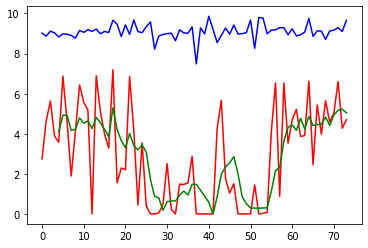

In [146]:
plt.plot(Entropy_H0_slug, 'b-')
plt.plot(Entropy_H1_slug, 'r-')
plt.plot(Entropy_H1_slug.rolling(5).mean(), 'g-')

In [147]:
tmp = slugSIM_norm_entropies
Entropy_H0 = []
Entropy_H1 = []

for item in tmp:
    Entropy_H0.append(item[0][0])
    Entropy_H1.append(item[0][1])

Entropy_H0_slug = pd.Series(Entropy_H0)
Entropy_H1_slug = pd.Series(Entropy_H1)

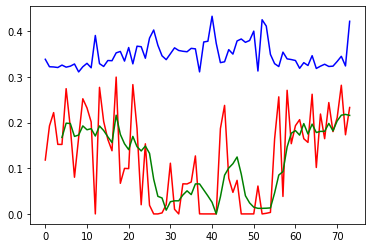

In [148]:
plt.plot(Entropy_H0_slug, 'b-')
plt.plot(Entropy_H1_slug, 'r-')
plt.plot(Entropy_H1_slug.rolling(5).mean(), 'g-')

In [223]:
slug_data_df = pd.read_csv("/Users/simo/repos/RareEventsDataset/3w_dataset-master/data/data/3/SIMULATED_00005.csv")

In [224]:
slug_data_df

,timestamp,P-PDG,P-TPT,T-TPT,P-MON-CKP,T-JUS-CKP,P-JUS-CKGL,T-JUS-CKGL,QGL,class
0,2018-04-08 03:23:38.000000,26201590.0,16807680.0,118.3466,4047800.0,83.66679,NaN,NaN,NaN,3
1,2018-04-08 03:23:39.000000,26201410.0,16807450.0,118.3465,4047815.0,83.66234,NaN,NaN,NaN,3
2,2018-04-08 03:23:40.000000,26201220.0,16807220.0,118.3464,4047830.0,83.65790,NaN,NaN,NaN,3
3,2018-04-08 03:23:41.000000,26201030.0,16806980.0,118.3462,4047843.0,83.65346,NaN,NaN,NaN,3
4,2018-04-08 03:23:42.000000,26200840.0,16806750.0,118.3461,4047856.0,83.64903,NaN,NaN,NaN,3
...,...,...,...,...,...,...,...,...,...,...
61994,2018-04-08 20:36:52.000000,26910280.0,17541780.0,112.9325,4051613.0,49.87471,NaN,NaN,NaN,3
61995,2018-04-08 20:36:53.000000,26910300.0,17541870.0,112.9322,4051594.0,49.87138,NaN,NaN,NaN,3
61996,2018-04-08 20:36:54.000000,26910310.0,17541950.0,112.9320,4051575.0,49.86807,NaN,NaN,NaN,3
61997,2018-04-08 20:36:55.000000,26910330.0,17542030.0,112.9317,4051555.0,49.86476,NaN,NaN,NaN,3


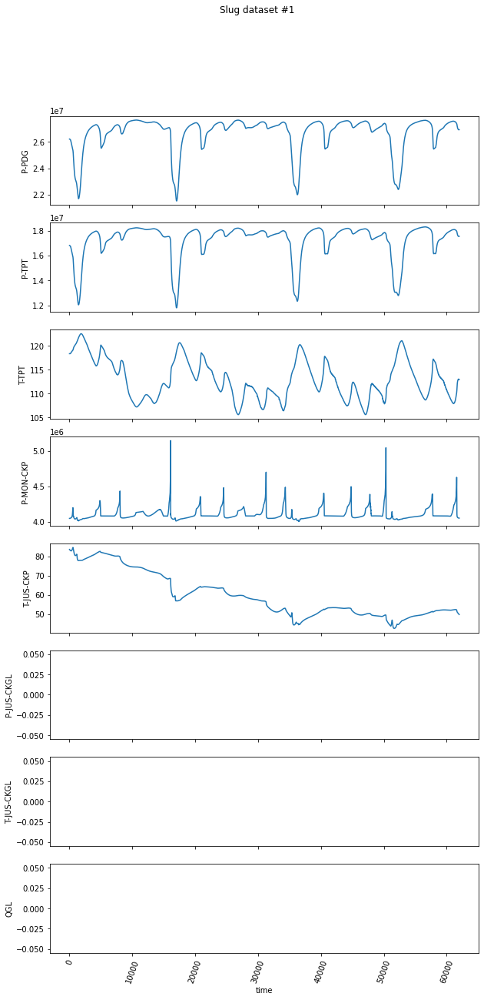

In [225]:
fig, ts = plt.subplots(8,figsize=(10,20),sharex = True)

fig.suptitle('Slug dataset #1')
ts[7].set_xlabel('time')
ts[0].set_ylabel("P-PDG")
ts[1].set_ylabel('P-TPT')
ts[2].set_ylabel('T-TPT')
ts[3].set_ylabel("P-MON-CKP")
ts[4].set_ylabel('T-JUS-CKP')
ts[5].set_ylabel('P-JUS-CKGL')
ts[6].set_ylabel("T-JUS-CKGL")
ts[7].set_ylabel('QGL')

degrees = 70
plt.xticks(rotation=degrees)

ts[0].plot(slug_data_df.index, slug_data_df["P-PDG"])
ts[1].plot(slug_data_df.index, slug_data_df["P-TPT"])
ts[2].plot(slug_data_df.index, slug_data_df["T-TPT"])
ts[3].plot(slug_data_df.index, slug_data_df["P-MON-CKP"])
ts[4].plot(slug_data_df.index, slug_data_df["T-JUS-CKP"])
ts[5].plot(slug_data_df.index, slug_data_df["P-JUS-CKGL"])
ts[6].plot(slug_data_df.index, slug_data_df["T-JUS-CKGL"])
ts[7].plot(slug_data_df.index, slug_data_df["QGL"])


In [226]:
slug_data_df['P-TPT'].isnull().values.any()

False

In [227]:
slug_data_df= slug_data_df.interpolate()

In [233]:
period = 50
periodicSampler = Resampler(period=period)
slug_data_df = slug_data_df.interpolate(method='linear')
signal = slug_data_df["P-TPT"]

#slug_data_df.index, slug_data_df["P-TPT"]
index_sampled, signal_sampled = periodicSampler.fit_transform_resample(slug_data_df.index, signal)

#print(index_sampled, signal_sampled, len(signal_sampled))

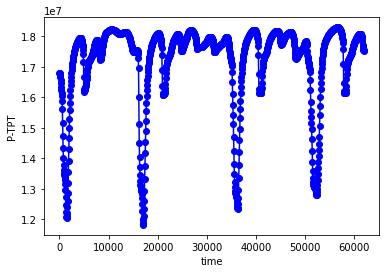

In [234]:
signal_downsampled = pd.DataFrame(signal_sampled,
                  index=index_sampled, columns=['P-TPT'])
#signal_downsampled['P-TPT']
plt.xlabel('time');
plt.ylabel('P-TPT');
plt.plot(signal_downsampled.index,signal_downsampled['P-TPT'], 'bo-')

In [236]:
print('length of signal to analyze', len(signal_downsampled))

max_time_delay = 150 
max_embedding_dimension = 15
stride = 1

optimal_time_delay, optimal_embedding_dimension = takens_embedding_optimal_parameters(
    signal_downsampled, max_time_delay, max_embedding_dimension, stride=stride
    )

print(f"Optimal embedding time delay based on mutual information: {optimal_time_delay}")
print(f"Optimal embedding dimension based on false nearest neighbors: {optimal_embedding_dimension}")

embedding_dimension = optimal_embedding_dimension
embedding_time_delay = optimal_time_delay

embedder = SingleTakensEmbedding(
    parameters_type="fixed", n_jobs=6, time_delay=embedding_time_delay, dimension=embedding_dimension, stride=stride
)

signal_embedded = embedder.fit_transform(signal_downsampled)

pca = PCA(n_components=3)
signal_embedded_pca = pca.fit_transform(signal_embedded)

plot_point_cloud(signal_embedded_pca)

length of signal to analyze 1240
Optimal embedding time delay based on mutual information: 58
Optimal embedding dimension based on false nearest neighbors: 11


In [237]:
homology_dimensions = (0, 1)
VRP = VietorisRipsPersistence(homology_dimensions=homology_dimensions)

signal_embedded_reshaped = signal_embedded.reshape(1, *signal_embedded.shape)
print(f"y_wn_embedded_reshaped.shape",signal_embedded_reshaped.shape)
print(f"y_wn_embedded.shape", signal_embedded.shape)

PerHom_signal = VRP.fit_transform(signal_embedded_reshaped)
VRP.plot(PerHom_signal)

y_wn_embedded_reshaped.shape (1, 660, 11)
y_wn_embedded.shape (660, 11)


In [238]:
PE_slug = PersistenceEntropy()
PE_slug_norm = PersistenceEntropy(normalize=True)
features = PE_slug.fit_transform(PerHom_signal)
features_norm = PE_slug_norm.fit_transform(PerHom_signal)

In [239]:
features

array([[9.14272792, 4.02067644]])

In [240]:
features_norm

array([[0.33100592, 0.1620816 ]])

In [265]:
slug_data_sim_df = pd.read_csv("/Users/simo/repos/RareEventsDataset/3w_dataset-master/data/data/8/WELL-00021_20170509013517.csv")

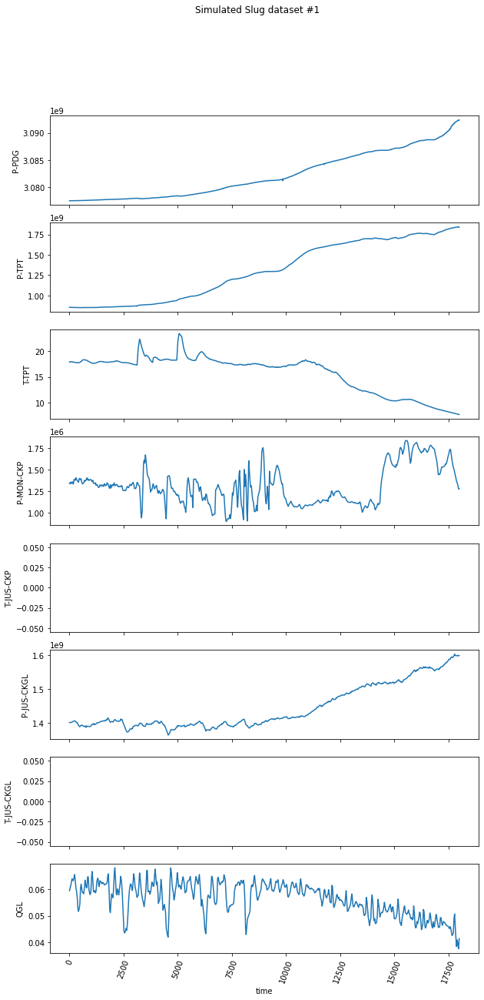

In [266]:
slug_data_sim_df = slug_data_sim_df.head(18000)

fig, ts = plt.subplots(8,figsize=(10,20),sharex = True)

fig.suptitle('Simulated Slug dataset #1')
ts[7].set_xlabel('time')
ts[0].set_ylabel("P-PDG")
ts[1].set_ylabel('P-TPT')
ts[2].set_ylabel('T-TPT')
ts[3].set_ylabel("P-MON-CKP")
ts[4].set_ylabel('T-JUS-CKP')
ts[5].set_ylabel('P-JUS-CKGL')
ts[6].set_ylabel("T-JUS-CKGL")
ts[7].set_ylabel('QGL')

degrees = 70
plt.xticks(rotation=degrees)

ts[0].plot(slug_data_sim_df.index, slug_data_sim_df["P-PDG"])
ts[1].plot(slug_data_sim_df.index, slug_data_sim_df["P-TPT"])
ts[2].plot(slug_data_sim_df.index, slug_data_sim_df["T-TPT"])
ts[3].plot(slug_data_sim_df.index, slug_data_sim_df["P-MON-CKP"])
ts[4].plot(slug_data_sim_df.index, slug_data_sim_df["T-JUS-CKP"])
ts[5].plot(slug_data_sim_df.index, slug_data_sim_df["P-JUS-CKGL"])
ts[6].plot(slug_data_sim_df.index, slug_data_sim_df["T-JUS-CKGL"])
ts[7].plot(slug_data_sim_df.index, slug_data_sim_df["QGL"])


In [253]:
period = 5
periodicSampler = Resampler(period=period)
signal = slug_data_sim_df["P-TPT"]

slug_data_sim_df.index, slug_data_sim_df["P-TPT"]
index_sampled, signal_sim_sampled = periodicSampler.fit_transform_resample(slug_data_sim_df.index, signal)


In [254]:
signal_sim_sampled

array([17747090., 17748130., 17749180., ..., 17782190., 17780100.,
       17776750.])

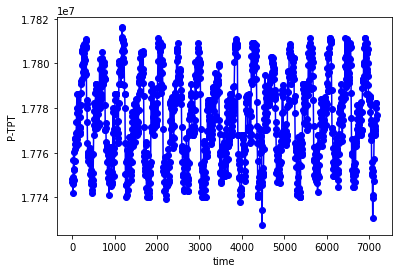

In [255]:
signal_sim_downsampled = pd.DataFrame(signal_sim_sampled,
                  index=index_sampled, columns=['P-TPT'])
plt.xlabel('time');
plt.ylabel('P-TPT');
plt.plot(signal_sim_downsampled.index,signal_sim_downsampled['P-TPT'], 'bo-')

In [256]:
print('length of signal to analyze', len(signal_sim_downsampled))

max_time_delay = 50 
max_embedding_dimension = 10
stride = 1

optimal_time_delay, optimal_embedding_dimension = takens_embedding_optimal_parameters(
    signal_sim_downsampled, max_time_delay, max_embedding_dimension, stride=stride
    )

print(f"Optimal embedding time delay based on mutual information: {optimal_time_delay}")
print(f"Optimal embedding dimension based on false nearest neighbors: {optimal_embedding_dimension}")

embedding_dimension = optimal_embedding_dimension
embedding_time_delay = optimal_time_delay

embedder = SingleTakensEmbedding(
    parameters_type="search", n_jobs=6, time_delay=embedding_time_delay, dimension=embedding_dimension, stride=stride
)

signal_sim_embedded = embedder.fit_transform(signal_sim_downsampled)

pca = PCA(n_components=3)
signal_sim_embedded_pca = pca.fit_transform(signal_sim_embedded)

plot_point_cloud(signal_sim_embedded_pca)

length of signal to analyze 1436
Optimal embedding time delay based on mutual information: 16
Optimal embedding dimension based on false nearest neighbors: 9


In [257]:
signal_sim_embedded_reshaped = signal_sim_embedded.reshape(1, *signal_sim_embedded.shape)
print(f"y_wn_embedded_reshaped.shape",signal_sim_embedded_reshaped.shape)
print(f"y_wn_embedded.shape", signal_sim_embedded_reshaped.shape)

PerHom_sim_signal = VRP.fit_transform(signal_sim_embedded_reshaped)
features_sim = PE_slug.fit_transform(PerHom_signal)
features_sim_norm = PE_slug_norm.fit_transform(PerHom_signal)

y_wn_embedded_reshaped.shape (1, 1308, 9)
y_wn_embedded.shape (1, 1308, 9)


In [258]:
features_sim

array([[9.14272792, 4.02067644]])

In [259]:
features_sim_norm

array([[0.33100592, 0.1620816 ]])

In [260]:
VRP.plot(PerHom_sim_signal)

In [82]:
PerHom_sim_signal.shape

(1, 919, 3)

In [89]:
PerHom_signal.shape

#tmp = np.vstack([PerHom_signal,PerHom_sim_signal])
#tmp.shape

(1, 533, 3)

In [94]:
diagramScaler = Scaler()
PerHom_signal_scaled = diagramScaler.fit_transform(PerHom_signal)
diagramScaler.plot(PerHom_signal_scaled)

In [92]:
PerHom_signal_sim_scaled = diagramScaler.fit_transform(PerHom_sim_signal)
diagramScaler.plot(PerHom_signal_sim_scaled)

In [95]:
features_sim = PE_slug.fit_transform(PerHom_signal_scaled)
features_sim_norm = PE_slug_norm.fit_transform(PerHom_signal_scaled)
features_sim

array([[8.85156327, 2.40306284, 4.83440879]])

In [96]:
features_sim_norm

array([[  1.49319727,   1.05423515, -11.44457834]])

In [111]:
HK = HeatKernel(sigma=.15, n_bins=60, n_jobs=-1) 
HK_slug = HK.fit_transform_plot(PerHom_signal_scaled, homology_dimension_idx=1)

In [112]:
HK.fit_transform_plot(PerHom_signal_sim_scaled, homology_dimension_idx=1)

array([[[[ 5.07638691e+02,  4.99572666e+02,  4.91460183e+02, ...,
           1.66820580e+01,  8.32249323e+00,  0.00000000e+00],
         [ 5.00163881e+02,  4.92070493e+02,  4.83931025e+02, ...,
           8.36008392e+00,  0.00000000e+00, -8.32249323e+00],
         [ 4.92624107e+02,  4.84503736e+02,  4.76337670e+02, ...,
           0.00000000e+00, -8.36008392e+00, -1.66820580e+01],
         ...,
         [ 1.78456729e+01,  8.93264763e+00,  0.00000000e+00, ...,
          -4.76337670e+02, -4.83931025e+02, -4.91460183e+02],
         [ 8.91354577e+00,  0.00000000e+00, -8.93264763e+00, ...,
          -4.84503736e+02, -4.92070493e+02, -4.99572666e+02],
         [ 0.00000000e+00, -8.91354577e+00, -1.78456729e+01, ...,
          -4.92624107e+02, -5.00163881e+02, -5.07638691e+02]],

        [[ 6.89021565e+00,  6.71087491e+00,  6.20037748e+00, ...,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
         [ 7.07434908e+00,  6.89021565e+00,  6.36607574e+00, ...,
           0.00000000e